Invariance of SIFT Features

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


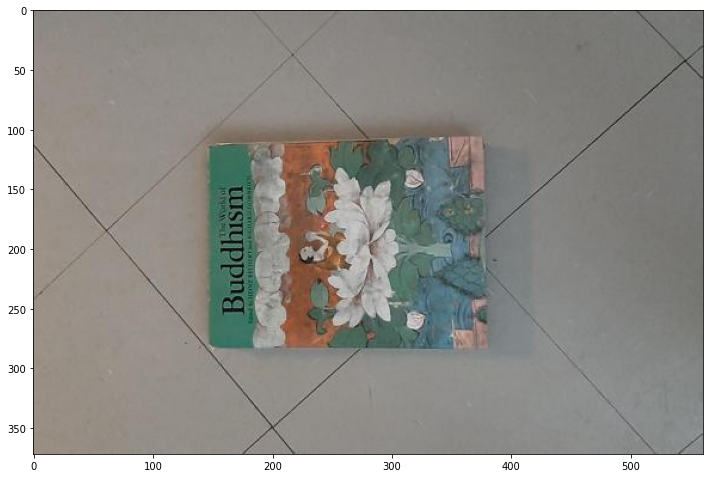

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
import numpy as np
import os

%matplotlib inline
from google.colab import drive
drive.mount('/content/drive')

# Read in the image
book = cv2.imread('./book.jpg') # use your own image path
book = cv2.cvtColor(book, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(12,16))
plt.imshow(book)

In [ ]:
#include needed libraries
#!pip install opencv-python==4.4.0.44
!pip install opencv-contrib-python==4.4.0.44
!pip list

Package                       Version        
----------------------------- ---------------
absl-py                       0.10.0         
alabaster                     0.7.12         
albumentations                0.1.12         
altair                        4.1.0          
argon2-cffi                   20.1.0         
asgiref                       3.2.10         
astor                         0.8.1          
astropy                       4.0.1.post1    
astunparse                    1.6.3          
async-generator               1.10           
atari-py                      0.2.6          
atomicwrites                  1.4.0          
attrs                         20.2.0         
audioread                     2.1.8          
autograd                      1.3            
Babel                         2.8.0          
backcall                      0.2.0          
beautifulsoup4                4.6.3          
bleach                        3.2.1          
blis                          0.4.

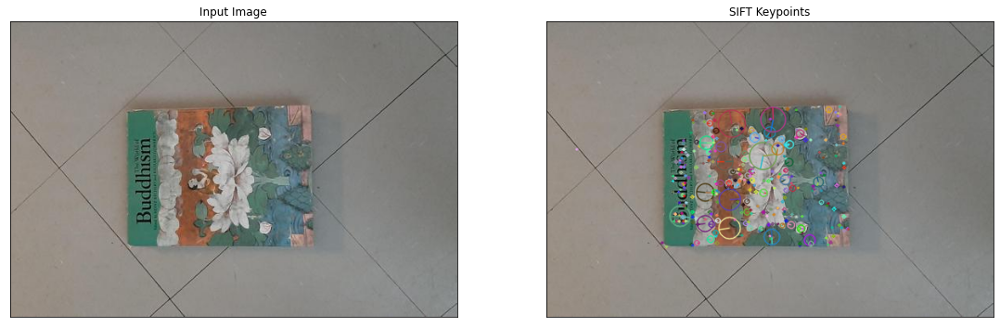

Num keypoints: 384


In [ ]:
#copy the image for drawing sift keypoints
bookCopy = book.copy()
#get sift points of book
sift = cv2.xfeatures2d.SIFT_create()
keypoints = sift.detect(book, None)
#draw keypoints on image copy drawKeypoints(src, srckeypoints, outputimage, keypointscolour, flags)
cv2.drawKeypoints(book, keypoints, bookCopy, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# display
plt.figure(figsize=(19,19))
plt.subplot(1,2,1), plt.imshow(book)
plt.title("Input Image"), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2), plt.imshow(bookCopy)
plt.title("SIFT Keypoints"), plt.xticks([]), plt.yticks([])
plt.show()

# num of SIFT keypoints
print('Num keypoints: '+ str(len(keypoints)))

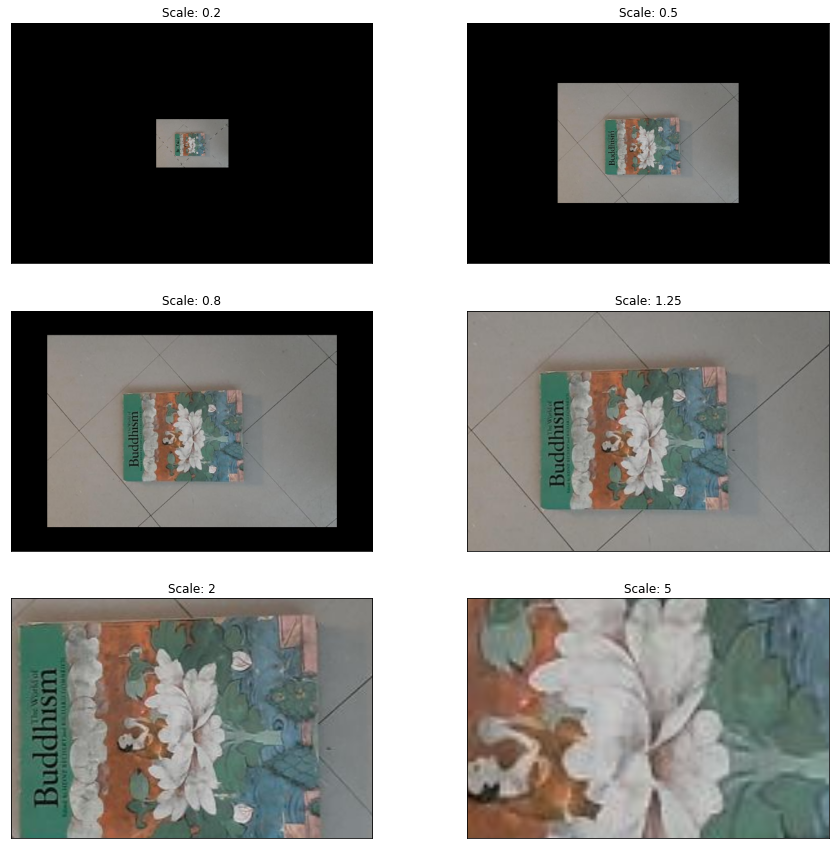

In [ ]:
#Scale the image
height, width = book.shape[0:2]

transform = cv2.getRotationMatrix2D((width/2,height/2),0,0.2)
book02 = cv2.warpAffine(book,transform,(width,height))

transform = cv2.getRotationMatrix2D((width/2,height/2),0,0.5)
book05 = cv2.warpAffine(book,transform,(width,height))

transform = cv2.getRotationMatrix2D((width/2,height/2),0,0.8)
book08 = cv2.warpAffine(book,transform,(width,height))

transform = cv2.getRotationMatrix2D((width/2,height/2),0,1.25)
book125 = cv2.warpAffine(book,transform,(width,height))

transform = cv2.getRotationMatrix2D((width/2,height/2),0,2)
book2 = cv2.warpAffine(book,transform,(width,height))

transform = cv2.getRotationMatrix2D((width/2,height/2),0,5)
book5 = cv2.warpAffine(book,transform,(width,height))

# display (Note: black bars appear for zoom out images, sincer there is no more photo when you zoom out)
plt.figure(figsize=(15,15))
plt.subplot(3,2,1), plt.imshow(book02)
plt.title("Scale: 0.2"), plt.xticks([]), plt.yticks([])
plt.subplot(3,2,2), plt.imshow(book05)
plt.title("Scale: 0.5"), plt.xticks([]), plt.yticks([])
plt.subplot(3,2,3), plt.imshow(book08)
plt.title("Scale: 0.8"), plt.xticks([]), plt.yticks([])
plt.subplot(3,2,4), plt.imshow(book125)
plt.title("Scale: 1.25"), plt.xticks([]), plt.yticks([])
plt.subplot(3,2,5), plt.imshow(book2)
plt.title("Scale: 2"), plt.xticks([]), plt.yticks([])
plt.subplot(3,2,6), plt.imshow(book5)
plt.title("Scale: 5"), plt.xticks([]), plt.yticks([])
plt.show()

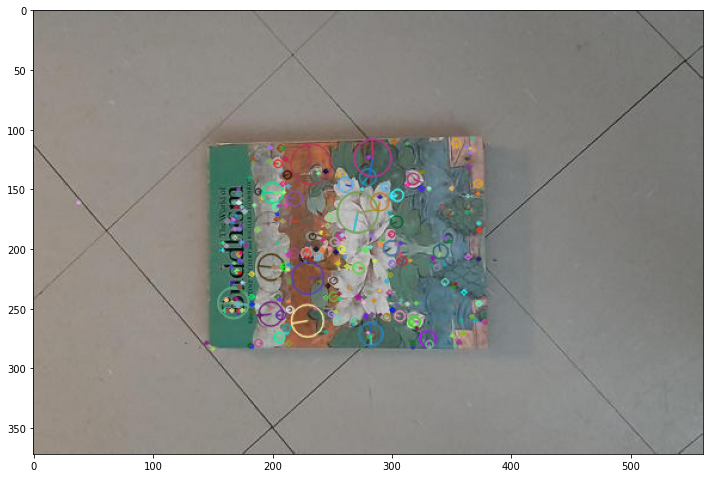

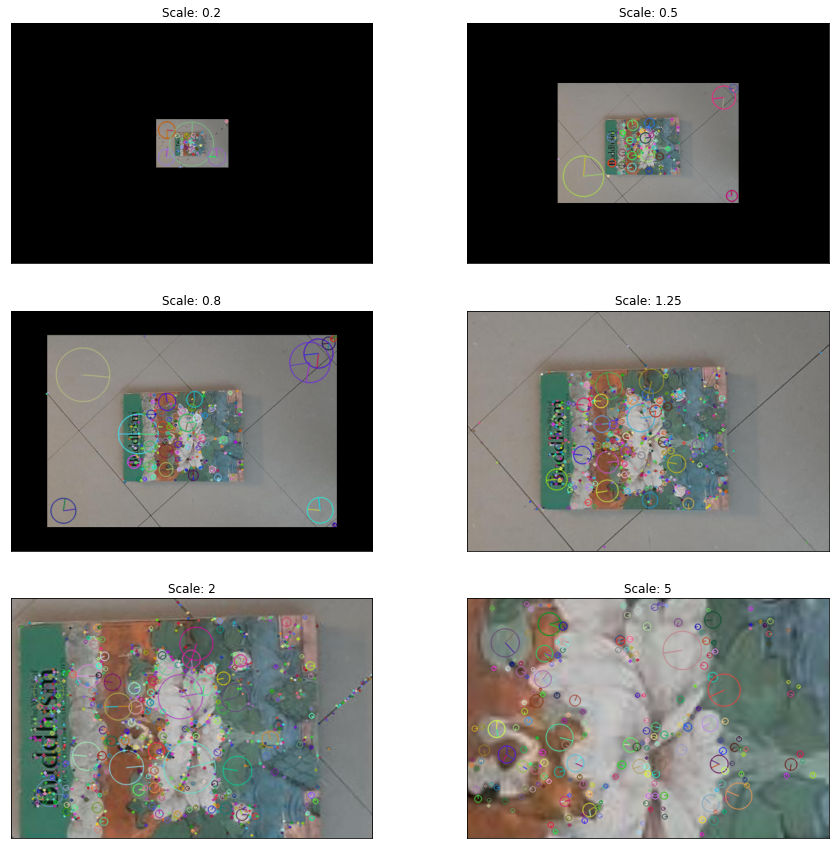

In [ ]:
#Apply SIFT features to all
sift = cv2.xfeatures2d.SIFT_create()
keypoints = sift.detect(book02, None)
#draw keypoints on image copy drawKeypoints(src, srckeypoints, outputimage, keypointscolour, flags)
book02Sift = cv2.drawKeypoints(book02, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

keypoints = sift.detect(book05, None)
book05Sift = cv2.drawKeypoints(book05, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

keypoints = sift.detect(book08, None)
book08Sift = cv2.drawKeypoints(book08, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

keypoints = sift.detect(book125, None)
book125Sift = cv2.drawKeypoints(book125, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

keypoints = sift.detect(book2, None)
book2Sift = cv2.drawKeypoints(book2, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

keypoints = sift.detect(book5, None)
book5Sift = cv2.drawKeypoints(book5, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)


# display 
plt.figure(figsize=(12,16))
plt.imshow(bookCopy)


plt.figure(figsize=(15,15))
plt.subplot(3,2,1), plt.imshow(book02Sift)
plt.title("Scale: 0.2"), plt.xticks([]), plt.yticks([])
plt.subplot(3,2,2), plt.imshow(book05Sift)
plt.title("Scale: 0.5"), plt.xticks([]), plt.yticks([])
plt.subplot(3,2,3), plt.imshow(book08Sift)
plt.title("Scale: 0.8"), plt.xticks([]), plt.yticks([])
plt.subplot(3,2,4), plt.imshow(book125Sift)
plt.title("Scale: 1.25"), plt.xticks([]), plt.yticks([])
plt.subplot(3,2,5), plt.imshow(book2Sift)
plt.title("Scale: 2"), plt.xticks([]), plt.yticks([])
plt.subplot(3,2,6), plt.imshow(book5Sift)
plt.title("Scale: 5"), plt.xticks([]), plt.yticks([])
plt.show()

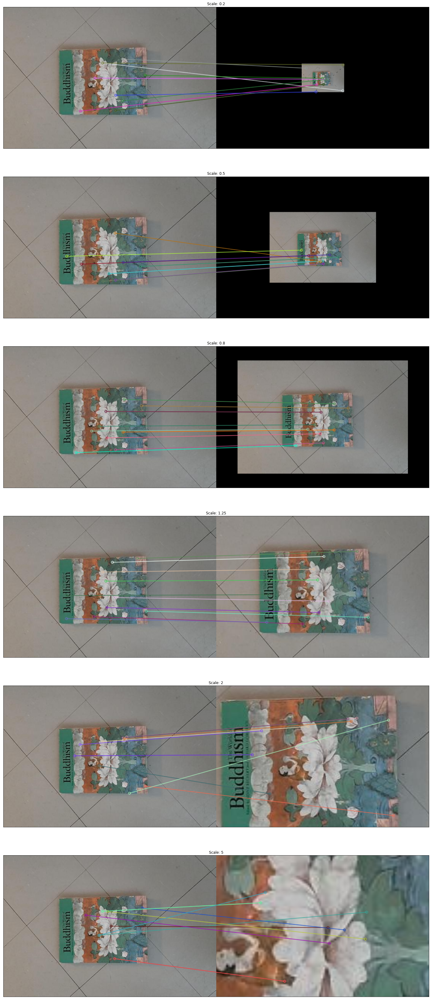

In [ ]:
#get sift keypoints and descripters
keypoints0,descriptors0 = sift.detectAndCompute(bookCopy,None)
keypoints1,descriptors1 = sift.detectAndCompute(book02Sift,None)
keypoints2,descriptors2 = sift.detectAndCompute(book05Sift,None)
keypoints3,descriptors3 = sift.detectAndCompute(book08Sift,None)
keypoints4,descriptors4 = sift.detectAndCompute(book125Sift,None)
keypoints5,descriptors5 = sift.detectAndCompute(book2Sift,None)
keypoints6,descriptors6 = sift.detectAndCompute(book5Sift,None)
#prepare brute force matcher
bf = cv2.BFMatcher()
#Match between images all keypoints using brute force
matches1 = bf.match(descriptors0,descriptors1)
matches2 = bf.match(descriptors0,descriptors2)
matches3 = bf.match(descriptors0,descriptors3)
matches4 = bf.match(descriptors0,descriptors4)
matches5 = bf.match(descriptors0,descriptors5)
matches6 = bf.match(descriptors0,descriptors6)
#sort matched keypoints by distance
matches1 = sorted(matches1, key = lambda x:x.distance)
matches2 = sorted(matches2, key = lambda x:x.distance)
matches3 = sorted(matches3, key = lambda x:x.distance)
matches4 = sorted(matches4, key = lambda x:x.distance)
matches5 = sorted(matches5, key = lambda x:x.distance)
matches6 = sorted(matches6, key = lambda x:x.distance)
#drawMatches
matches1Img = cv2.drawMatches(book,keypoints0,book02,keypoints1, matches1[:10], None, flags=2)
matches2Img = cv2.drawMatches(book,keypoints0,book05,keypoints2, matches2[:10], None, flags=2)
matches3Img = cv2.drawMatches(book,keypoints0,book08,keypoints3, matches3[:10], None, flags=2)
matches4Img = cv2.drawMatches(book,keypoints0,book125,keypoints4, matches4[:10], None, flags=2)
matches5Img = cv2.drawMatches(book,keypoints0,book2,keypoints5, matches5[:10], None, flags=2)
matches6Img = cv2.drawMatches(book,keypoints0,book5,keypoints6, matches6[:10], None, flags=2)

plt.figure(figsize=(60,60))
plt.subplot(6,1,1), plt.imshow(matches1Img)
plt.title("Scale: 0.2"), plt.xticks([]), plt.yticks([])
plt.subplot(6,1,2), plt.imshow(matches2Img)
plt.title("Scale: 0.5"), plt.xticks([]), plt.yticks([])
plt.subplot(6,1,3), plt.imshow(matches3Img)
plt.title("Scale: 0.8"), plt.xticks([]), plt.yticks([])
plt.subplot(6,1,4), plt.imshow(matches4Img)
plt.title("Scale: 1.25"), plt.xticks([]), plt.yticks([])
plt.subplot(6,1,5), plt.imshow(matches5Img)
plt.title("Scale: 2"), plt.xticks([]), plt.yticks([])
plt.subplot(6,1,6), plt.imshow(matches6Img)
plt.title("Scale: 5"), plt.xticks([]), plt.yticks([])
plt.show()

Image:Scale
1:0.2
2:0.5
3:0.5
4:1.25
5:2
6:5


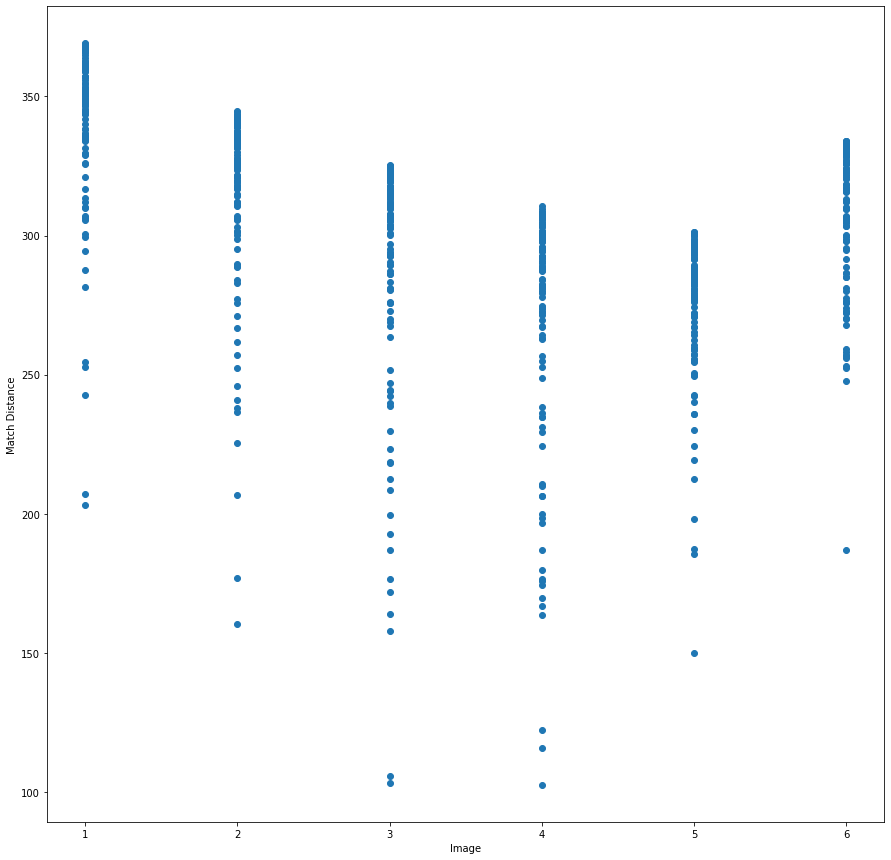

In [ ]:
#Present top 100 distances for each matching in somewhat nice way
x = []
y = []
for a in range(6):
  for b in range(100):
    x.append(a+1)
    if (a == 0):
      y.append(matches1[b].distance)
    elif (a == 1):
      y.append(matches2[b].distance)
    elif (a == 2):
      y.append(matches3[b].distance)
    elif (a == 3):
      y.append(matches4[b].distance)
    elif (a == 4):
      y.append(matches5[b].distance)
    else:
      y.append(matches6[b].distance)

plt.figure(figsize=(15,15))
plt.xlabel("Image")
plt.ylabel("Match Distance")
plt.scatter(x,y)
print("Image:Scale")
print("1:0.2")
print("2:0.5")
print("3:0.5")
print("4:1.25")
print("5:2")
print("6:5")

Discuss the trend in the plotted results. What is the effect of increasing
the scale on the matching distance? Reason the cause

Zooming out is very bad and has a negative effect, as you move closer to the normal image there are improvements. Then as you you zoom in you may actually find imrpovements until you zoom in so close some keypoints are lost. This is due to in zoomout out -> keypoints are significantly smaller and when you zoom in -> you eventually lose keypoints.

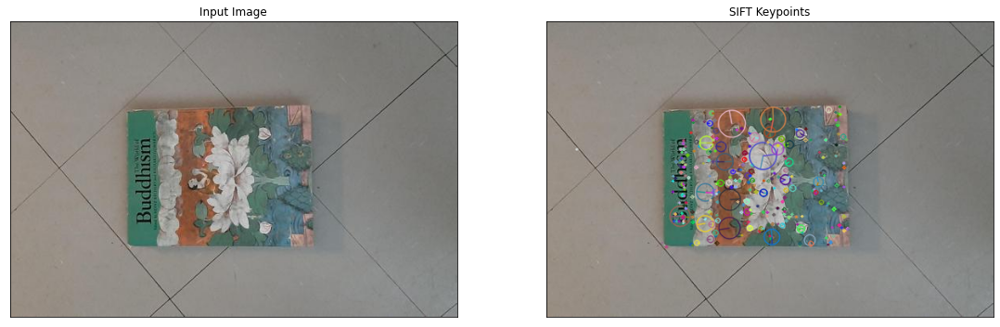

Num keypoints: 384


In [ ]:
#did this already but we will do again
#copy the image for drawing sift keypoints
bookSift = book.copy()
#get sift points of book
sift = cv2.xfeatures2d.SIFT_create()
keypoints = sift.detect(bookSift, None)
#draw keypoints on image copy drawKeypoints(src, srckeypoints, outputimage, keypointscolour, flags)
cv2.drawKeypoints(book, keypoints, bookSift, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# display
plt.figure(figsize=(19,19))
plt.subplot(1,2,1), plt.imshow(book)
plt.title("Input Image"), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2), plt.imshow(bookSift)
plt.title("SIFT Keypoints"), plt.xticks([]), plt.yticks([])
plt.show()

# num of SIFT keypoints
print('Num keypoints: '+ str(len(keypoints)))

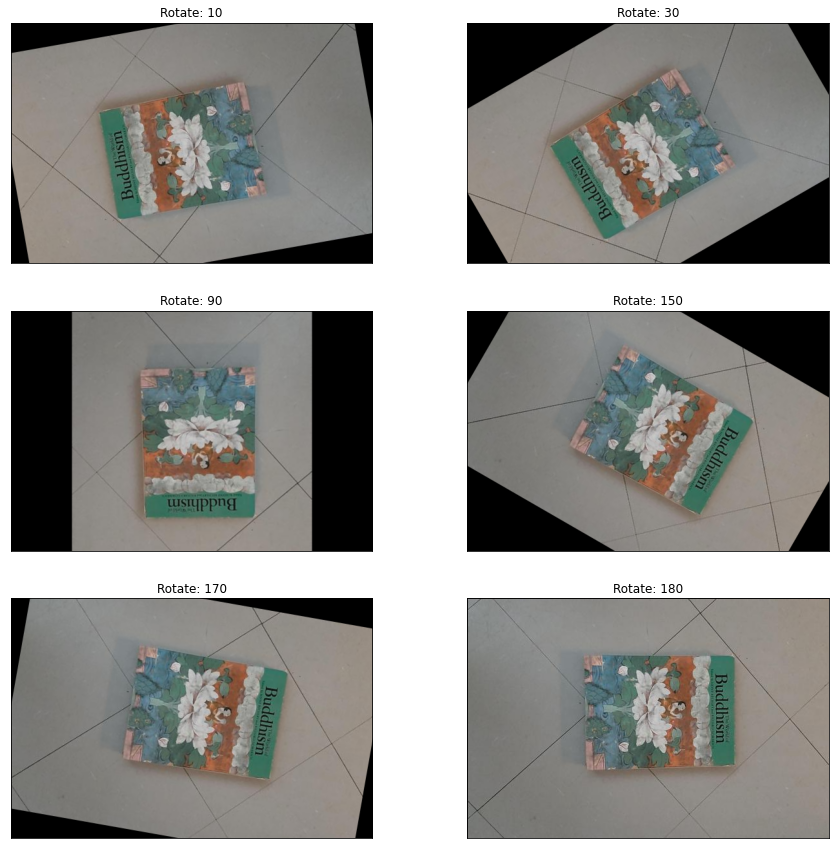

In [ ]:
#Rotate the image (10, 30, 90, 150, 170, 180)
height, width = book.shape[0:2]

transform = cv2.getRotationMatrix2D((width/2,height/2),10,1)
book10 = cv2.warpAffine(book,transform,(width,height))

transform = cv2.getRotationMatrix2D((width/2,height/2),30,1)
book30 = cv2.warpAffine(book,transform,(width,height))

transform = cv2.getRotationMatrix2D((width/2,height/2),90,1)
book90 = cv2.warpAffine(book,transform,(width,height))

transform = cv2.getRotationMatrix2D((width/2,height/2),150,1)
book150 = cv2.warpAffine(book,transform,(width,height))

transform = cv2.getRotationMatrix2D((width/2,height/2),170,1)
book170 = cv2.warpAffine(book,transform,(width,height))

transform = cv2.getRotationMatrix2D((width/2,height/2),180,1)
book180 = cv2.warpAffine(book,transform,(width,height))

# display 
plt.figure(figsize=(15,15))
plt.subplot(3,2,1), plt.imshow(book10)
plt.title("Rotate: 10"), plt.xticks([]), plt.yticks([])
plt.subplot(3,2,2), plt.imshow(book30)
plt.title("Rotate: 30"), plt.xticks([]), plt.yticks([])
plt.subplot(3,2,3), plt.imshow(book90)
plt.title("Rotate: 90"), plt.xticks([]), plt.yticks([])
plt.subplot(3,2,4), plt.imshow(book150)
plt.title("Rotate: 150"), plt.xticks([]), plt.yticks([])
plt.subplot(3,2,5), plt.imshow(book170)
plt.title("Rotate: 170"), plt.xticks([]), plt.yticks([])
plt.subplot(3,2,6), plt.imshow(book180)
plt.title("Rotate: 180"), plt.xticks([]), plt.yticks([])
plt.show()

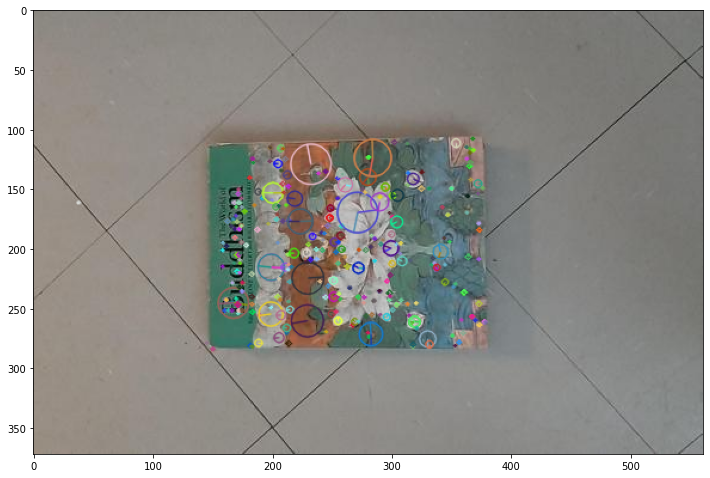

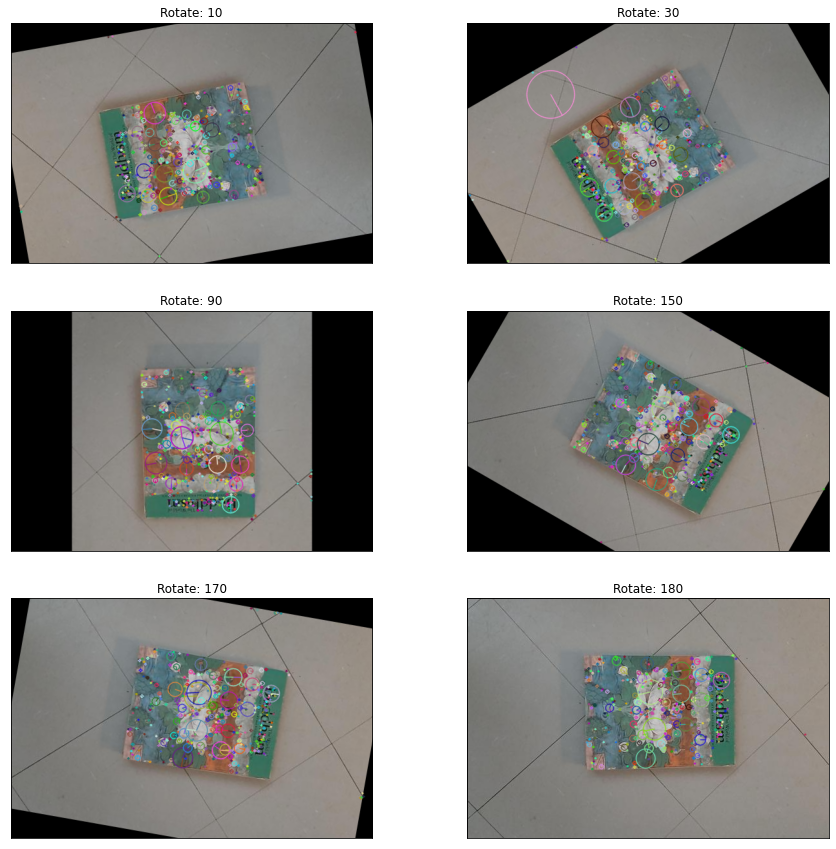

In [ ]:
#Apply SIFT features to all
sift = cv2.xfeatures2d.SIFT_create()
keypoints = sift.detect(book10, None)
#draw keypoints on image copy drawKeypoints(src, srckeypoints, outputimage, keypointscolour, flags)
book10Sift = cv2.drawKeypoints(book10, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

keypoints = sift.detect(book30, None)
book30Sift = cv2.drawKeypoints(book30, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

keypoints = sift.detect(book90, None)
book90Sift = cv2.drawKeypoints(book90, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

keypoints = sift.detect(book150, None)
book150Sift = cv2.drawKeypoints(book150, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

keypoints = sift.detect(book170, None)
book170Sift = cv2.drawKeypoints(book170, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

keypoints = sift.detect(book180, None)
book180Sift = cv2.drawKeypoints(book180, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)


# display 
plt.figure(figsize=(12,16))
plt.imshow(bookSift)


plt.figure(figsize=(15,15))
plt.subplot(3,2,1), plt.imshow(book10Sift)
plt.title("Rotate: 10"), plt.xticks([]), plt.yticks([])
plt.subplot(3,2,2), plt.imshow(book30Sift)
plt.title("Rotate: 30"), plt.xticks([]), plt.yticks([])
plt.subplot(3,2,3), plt.imshow(book90Sift)
plt.title("Rotate: 90"), plt.xticks([]), plt.yticks([])
plt.subplot(3,2,4), plt.imshow(book150Sift)
plt.title("Rotate: 150"), plt.xticks([]), plt.yticks([])
plt.subplot(3,2,5), plt.imshow(book170Sift)
plt.title("Rotate: 170"), plt.xticks([]), plt.yticks([])
plt.subplot(3,2,6), plt.imshow(book180Sift)
plt.title("Rotate: 180"), plt.xticks([]), plt.yticks([])
plt.show()

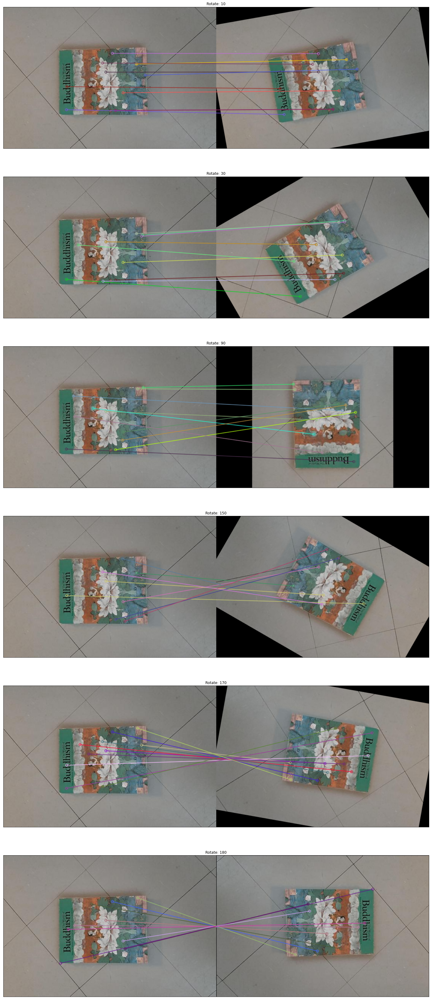

In [ ]:
#get sift keypoints and descripters
keypoints0,descriptors0 = sift.detectAndCompute(bookCopy,None)
keypoints1,descriptors1 = sift.detectAndCompute(book10Sift,None)
keypoints2,descriptors2 = sift.detectAndCompute(book30Sift,None)
keypoints3,descriptors3 = sift.detectAndCompute(book90Sift,None)
keypoints4,descriptors4 = sift.detectAndCompute(book150Sift,None)
keypoints5,descriptors5 = sift.detectAndCompute(book170Sift,None)
keypoints6,descriptors6 = sift.detectAndCompute(book180Sift,None)
#prepare brute force matcher
bf = cv2.BFMatcher()
#Match between images all keypoints using brute force
matches1 = bf.match(descriptors0,descriptors1)
matches2 = bf.match(descriptors0,descriptors2)
matches3 = bf.match(descriptors0,descriptors3)
matches4 = bf.match(descriptors0,descriptors4)
matches5 = bf.match(descriptors0,descriptors5)
matches6 = bf.match(descriptors0,descriptors6)
#sort matched keypoints by distance
matches1 = sorted(matches1, key = lambda x:x.distance)
matches2 = sorted(matches2, key = lambda x:x.distance)
matches3 = sorted(matches3, key = lambda x:x.distance)
matches4 = sorted(matches4, key = lambda x:x.distance)
matches5 = sorted(matches5, key = lambda x:x.distance)
matches6 = sorted(matches6, key = lambda x:x.distance)
#drawMatches
matches1Img = cv2.drawMatches(book,keypoints0,book10,keypoints1, matches1[:10], None, flags=2)
matches2Img = cv2.drawMatches(book,keypoints0,book30,keypoints2, matches2[:10], None, flags=2)
matches3Img = cv2.drawMatches(book,keypoints0,book90,keypoints3, matches3[:10], None, flags=2)
matches4Img = cv2.drawMatches(book,keypoints0,book150,keypoints4, matches4[:10], None, flags=2)
matches5Img = cv2.drawMatches(book,keypoints0,book170,keypoints5, matches5[:10], None, flags=2)
matches6Img = cv2.drawMatches(book,keypoints0,book180,keypoints6, matches6[:10], None, flags=2)

plt.figure(figsize=(60,60))
plt.subplot(6,1,1), plt.imshow(matches1Img)
plt.title("Rotate: 10"), plt.xticks([]), plt.yticks([])
plt.subplot(6,1,2), plt.imshow(matches2Img)
plt.title("Rotate: 30"), plt.xticks([]), plt.yticks([])
plt.subplot(6,1,3), plt.imshow(matches3Img)
plt.title("Rotate: 90"), plt.xticks([]), plt.yticks([])
plt.subplot(6,1,4), plt.imshow(matches4Img)
plt.title("Rotate: 150"), plt.xticks([]), plt.yticks([])
plt.subplot(6,1,5), plt.imshow(matches5Img)
plt.title("Rotate: 170"), plt.xticks([]), plt.yticks([])
plt.subplot(6,1,6), plt.imshow(matches6Img)
plt.title("Rotate: 180"), plt.xticks([]), plt.yticks([])
plt.show()

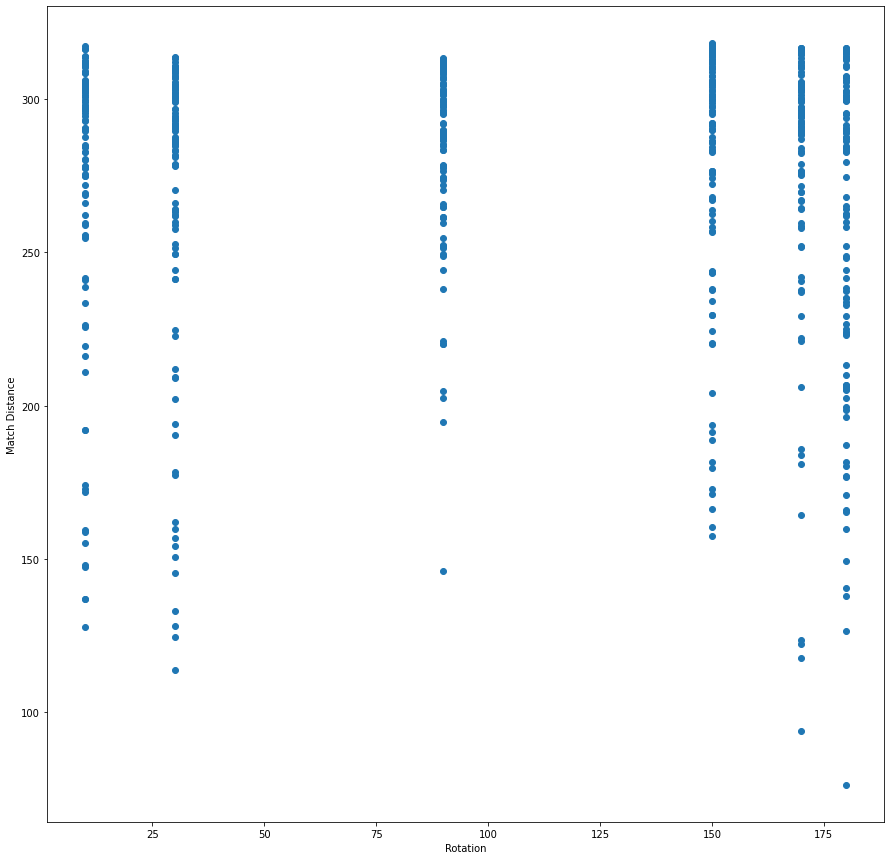

In [ ]:
#Present top 100 distances for each matching in somewhat nice way
x = []
y = []
for a in range(6):
  for b in range(100):
    if (a == 0):
      y.append(matches1[b].distance)
      x.append(10)
    elif (a == 1):
      y.append(matches2[b].distance)
      x.append(30)
    elif (a == 2):
      y.append(matches3[b].distance)
      x.append(90)
    elif (a == 3):
      y.append(matches4[b].distance)
      x.append(150)
    elif (a == 4):
      y.append(matches5[b].distance)
      x.append(170)
    else:
      y.append(matches6[b].distance)
      x.append(180)

plt.figure(figsize=(15,15))
plt.xlabel("Rotation")
plt.ylabel("Match Distance")
plt.scatter(x,y)


Discuss the trend in the plotted results. What is the effect of increasing
the angle of rotation on the matching distance? Reason the cause.

Increasing the angle of rotation seems to have little effect of matching distance, though the more rotated an image is makes performance slightly worse. This is likely because keypoints need to matched where one keypoint is right and one is upside down making them look less similar.

Matching Using SIFT

Text(0.5, 1.0, 'Book Occlusion')

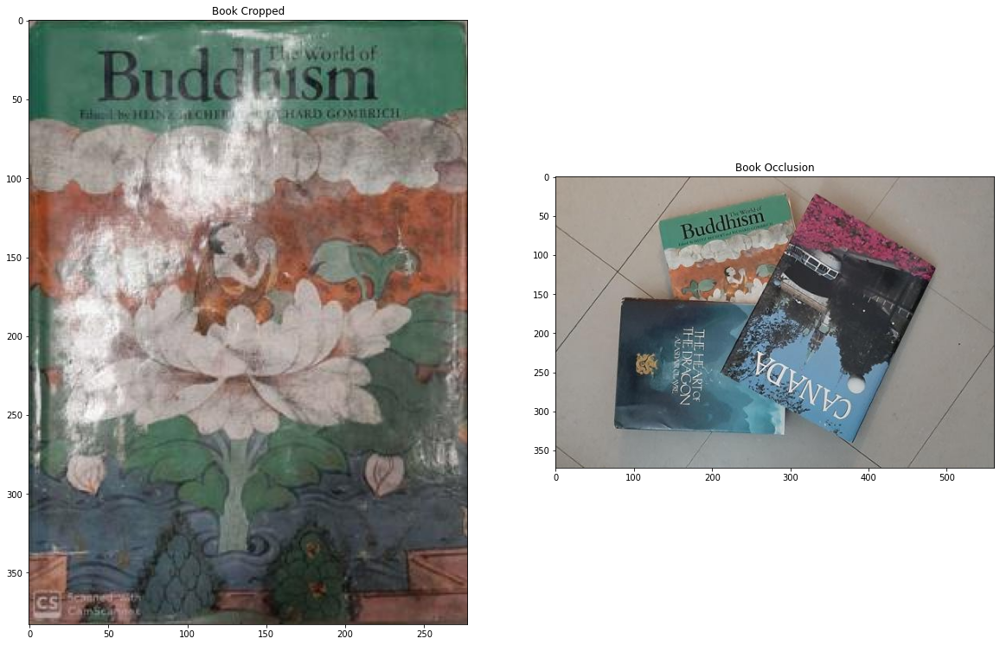

In [ ]:
bookCrop = cv2.imread('./book_crop.jpg') # use your own image path
bookOcc = cv2.imread('./book_occlusion.jpg')
bookCrop = cv2.cvtColor(bookCrop, cv2.COLOR_BGR2RGB)
bookOcc = cv2.cvtColor(bookOcc, cv2.COLOR_BGR2RGB)

#Display
plt.figure(figsize=(20,20))
plt.subplot(1,2,1), plt.imshow(bookCrop)
plt.title("Book Cropped")
plt.subplot(1,2,2), plt.imshow(bookOcc)
plt.title("Book Occlusion")

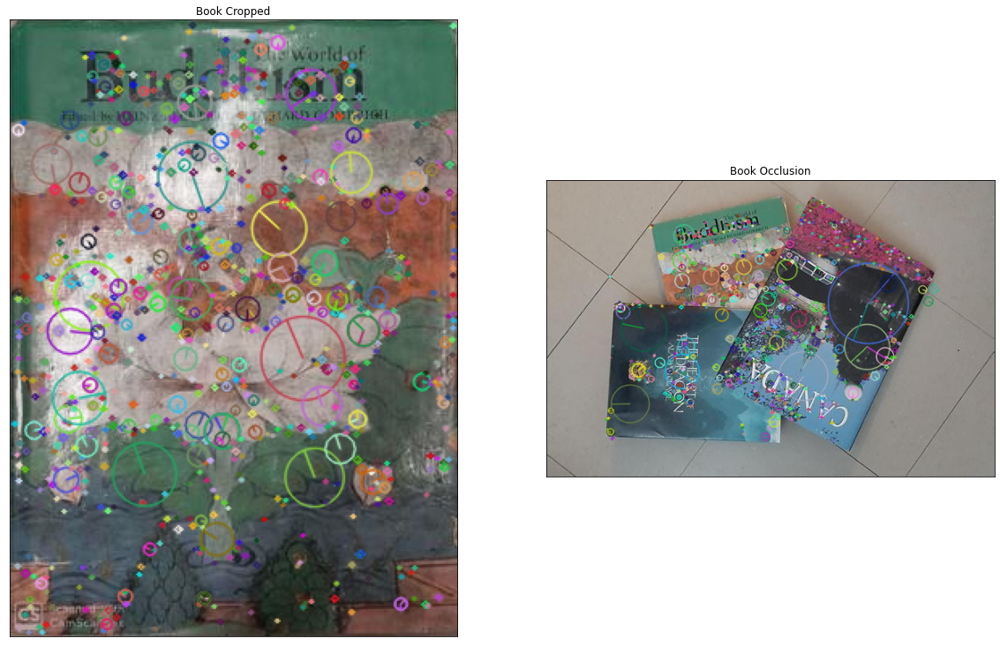

Num keypoints Cropped: 947
Num keypoints Occlusion: 769


In [ ]:
#copy the image for drawing sift keypoints
bookCropSift = bookCrop.copy() #Query Image
bookOccSift = bookOcc.copy() #Train Image
#get sift points of book
sift = cv2.xfeatures2d.SIFT_create()

keypoints1 = sift.detect(bookCropSift, None)
#draw keypoints on image copy drawKeypoints(src, srckeypoints, outputimage, keypointscolour, flags)
cv2.drawKeypoints(bookCrop, keypoints1, bookCropSift, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

keypoints2 = sift.detect(bookOccSift, None)
cv2.drawKeypoints(bookOcc, keypoints2, bookOccSift, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# display
plt.figure(figsize=(20,20))
plt.subplot(1,2,1), plt.imshow(bookCropSift)
plt.title("Book Cropped"), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2), plt.imshow(bookOccSift)
plt.title("Book Occlusion"), plt.xticks([]), plt.yticks([])
plt.show()

# num of SIFT keypoints
print('Num keypoints Cropped: '+ str(len(keypoints1)))
print('Num keypoints Occlusion: '+ str(len(keypoints2)))

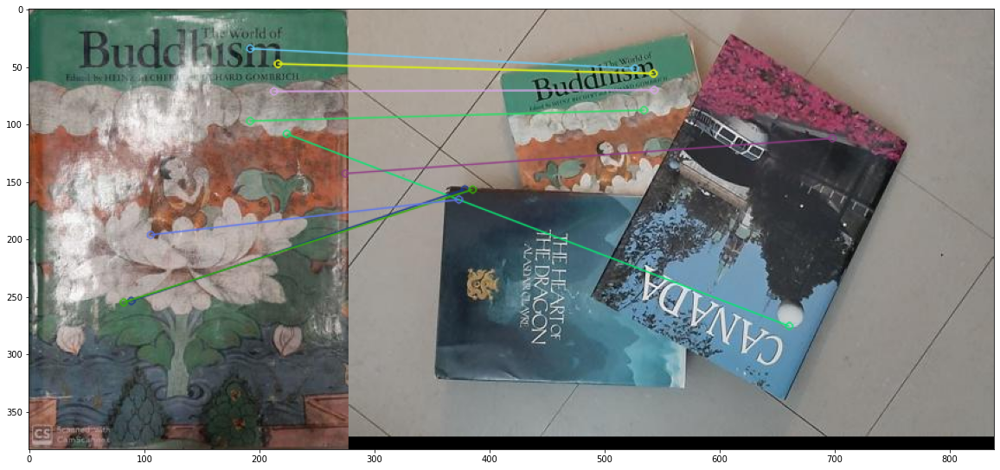

In [ ]:
#get sift keypoints and descripters
keypoints0,descriptors0 = sift.detectAndCompute(bookCrop,None)
keypoints1,descriptors1 = sift.detectAndCompute(bookOcc,None)
#prepare brute force matcher
bf = cv2.BFMatcher()
#Match between images all keypoints using brute force
bookMatches = bf.match(descriptors0,descriptors1) #Query,Train
#sort matched keypoints by distance
bookMatches = sorted(bookMatches, key = lambda x:x.distance)
#drawMatches
matchesImg = cv2.drawMatches(bookCrop,keypoints0,bookOcc,keypoints1, bookMatches[:10], None, flags=2)

plt.figure(figsize=(20,20))
plt.imshow(matchesImg)

(372, 561, 3)


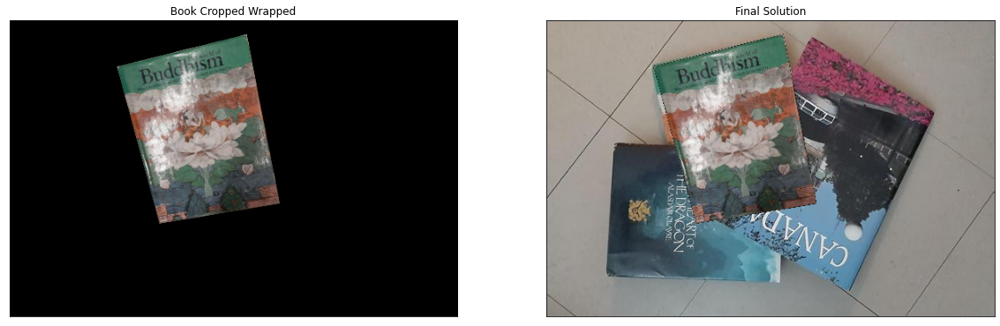

In [ ]:
#use RANSAC to find good matches and find homography
heightOcc, widthOcc = bookOcc.shape[0:2]
heightCrop, widthCrop = bookCrop.shape[0:2]
#going to apply an area of matches that we care about since getting good
#matches based off distance doesn't seem to be enough
#120
goodMatches = []
for i, m in enumerate(bookMatches):
    if (m.distance < 120) or (m.distance > 124 and m.distance < 128) or (m.distance > 130 and m.distance < 132): #had to cherry pick results to get 4 keypoints
        goodMatches.append((m.trainIdx, m.queryIdx))

#matchesImg2 = cv2.drawMatches(bookCrop,keypoints0,bookOcc,keypoints1, goodMatches, None, flags=2)

mpr = np.float32([keypoints0[i].pt for (__, i) in goodMatches])
mpl = np.float32([keypoints1[i].pt for (i, __) in goodMatches])

H,ignore = cv2.findHomography(mpr, mpl, cv2.RANSAC, 4)

wraped = cv2.warpPerspective(bookCrop, H, (widthOcc,heightOcc))
#Paste image over the original (I am sure there is a better way but this works)
print(wraped.shape)
for a in range(wraped.shape[0]):
  for b in range(wraped.shape[1]):
    for c in range(wraped.shape[2]):
      if (wraped[a][b][c] != 0):
        bookOccFinal[a][b][c] = wraped[a][b][c]
# display
plt.figure(figsize=(20,20))
plt.subplot(1,2,1), plt.imshow(wraped)
plt.title("Book Cropped Wrapped"), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2), plt.imshow(bookOccFinal)
plt.title("Final Solution"), plt.xticks([]), plt.yticks([])
plt.show()



Face detection 

In [36]:
#Load 100 random files (from discussion, mostly)
import random

my_files = [] # this variable will store names of your randomly selected 100 files
random.seed(11)
for i in random.sample(range(1, 1000), 100):
  randNum = str(i)
  l = 6 - len(randNum)
  for a in range(l):
    randNum = "0" + randNum
  my_files.append(randNum+".jpg")
imgArray = []
for b in range(len(my_files)):
  randImage = cv2.imread('./celebA_subset/'+my_files[b], cv2.IMREAD_GRAYSCALE)
  imgArray.append(randImage)

6


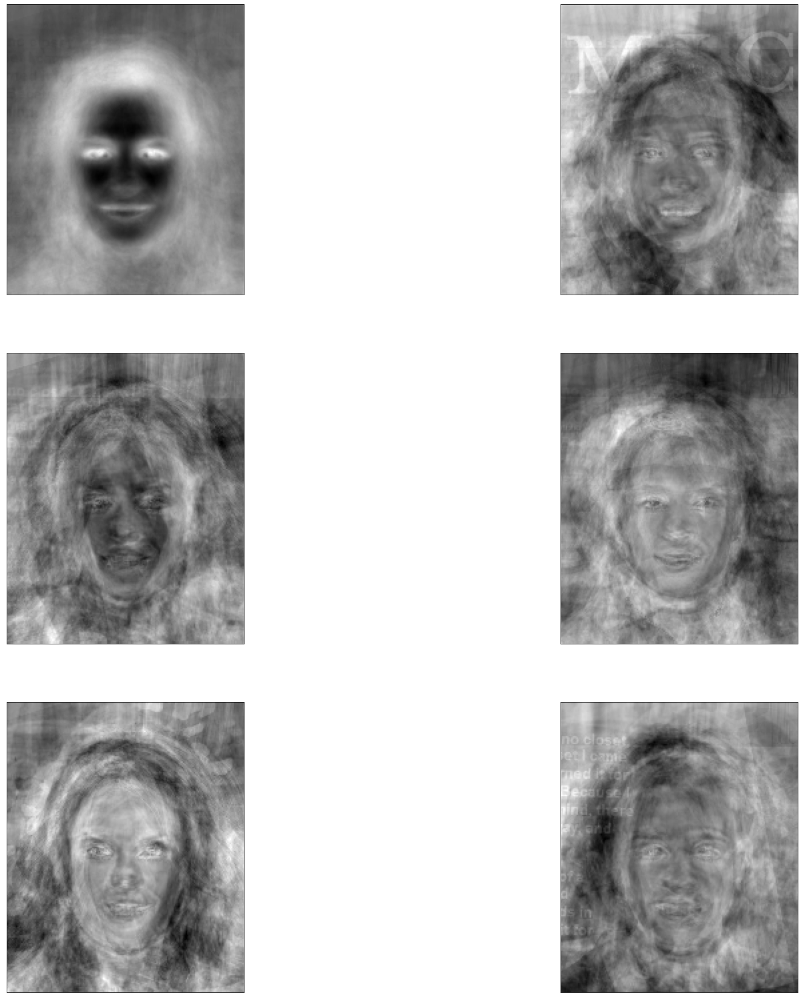

In [43]:
#make D by flattening images and making each array a colomn
D=imgArray[0].flatten()
D = D.reshape(38804,1)
for i in range(1,100):
  A = imgArray[i].flatten() 
  A = A.reshape(38804,1)
  D = np.concatenate((D,A), axis=1, out=None)

#get DTD
DT = D.transpose()
DTD = np.matmul(DT, D, out=None) #Snapshot method
values, vectors = np.linalg.eig(DTD) #get values and vectors
valuesSorted = np.sort(values)[::-1]
v = [] #get best eigen vectors
for a in range(6): #We will use best 6 for now, if dups will get more
  index = np.where(values == valuesSorted[a])
  for b in index:
    v.append(np.reshape(vectors[:,b],(1,100)))

faceArray = []
for i in range(len(v)):
  v[i] = np.matmul(v[i], DT, out=None) #forgive for the snapshot method
  faceArray.append(v[i].reshape(218, 178))#unflatten the eigenfaces

#Display (Even though they look like ghosts)
plt.figure(figsize=(30,30))
plt.subplot(3,2,1), plt.imshow(faceArray[0], cmap="gray")
plt.xticks([]), plt.yticks([])
plt.subplot(3,2,2), plt.imshow(faceArray[1], cmap="gray")
plt.xticks([]), plt.yticks([])
plt.subplot(3,2,3), plt.imshow(faceArray[2], cmap="gray")
plt.xticks([]), plt.yticks([])
plt.subplot(3,2,4), plt.imshow(faceArray[3], cmap="gray")
plt.xticks([]), plt.yticks([])
plt.subplot(3,2,5), plt.imshow(faceArray[4], cmap="gray")
plt.xticks([]), plt.yticks([])
plt.subplot(3,2,6), plt.imshow(faceArray[5], cmap="gray")
plt.xticks([]), plt.yticks([])
plt.show()


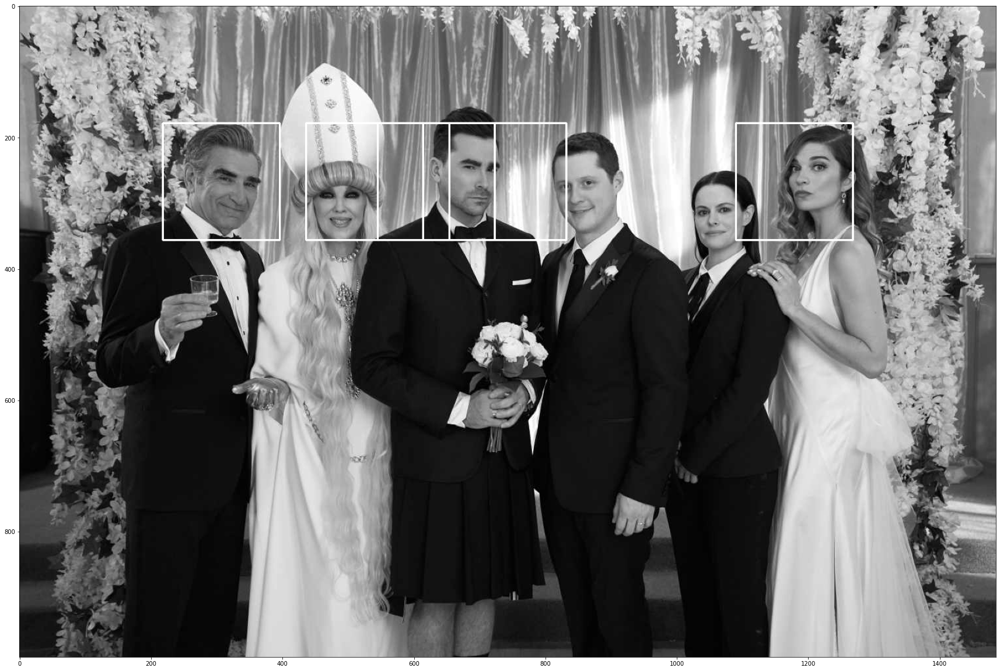

In [90]:
import matplotlib.patches as patches
creek = cv2.imread('./schitts_creek_group_photo.jpeg', cv2.IMREAD_GRAYSCALE)
creekWindow = []
x = []
for a in range(1,6): #get sliding window
  x.append(a*218)
  currentCreek = creek[178:356,a*218:(a+1)*218]
  creekWindow.append(currentCreek)
for d in range(1,5): #get sliding window
  x.append(d*218 + 109)
  currentCreek = creek[178:356,d*218 + 109:(d+1)*218 + 109]
  creekWindow.append(currentCreek)

foundFaces = []
for b in range(len(creekWindow)):
  sum = 0
  for c in range(len(faceArray)): #compare test image to eigenfaces
    result = np.dot(creekWindow[b], faceArray[c])
    creekWindowReshape = creekWindow[b][:178,:178]
    result = np.subtract(creekWindowReshape, result)
    sum += np.linalg.norm(result)
  sum = sum/len(faceArray)
  if (sum < 1360000000):#The threshold I chose
    foundFaces.append(b)

for i in foundFaces: #I assume I can use opencv for this
  creek = cv2.rectangle(creek,(x[i],178),(x[i]+178,178+178),(255,0,0),2)

plt.figure(figsize=(30,30))
plt.imshow(creek, cmap="gray")


How well does the method work? How many false positive
face detections do you get?

This method works fine, I had no false positives but missed a couple faces. I only had two sliding windows at face level. The only false positives I got with this method is it catches faces that are only partially included in the wondow. I assume I would have had many false positives had I had my sliding window go through all y positions

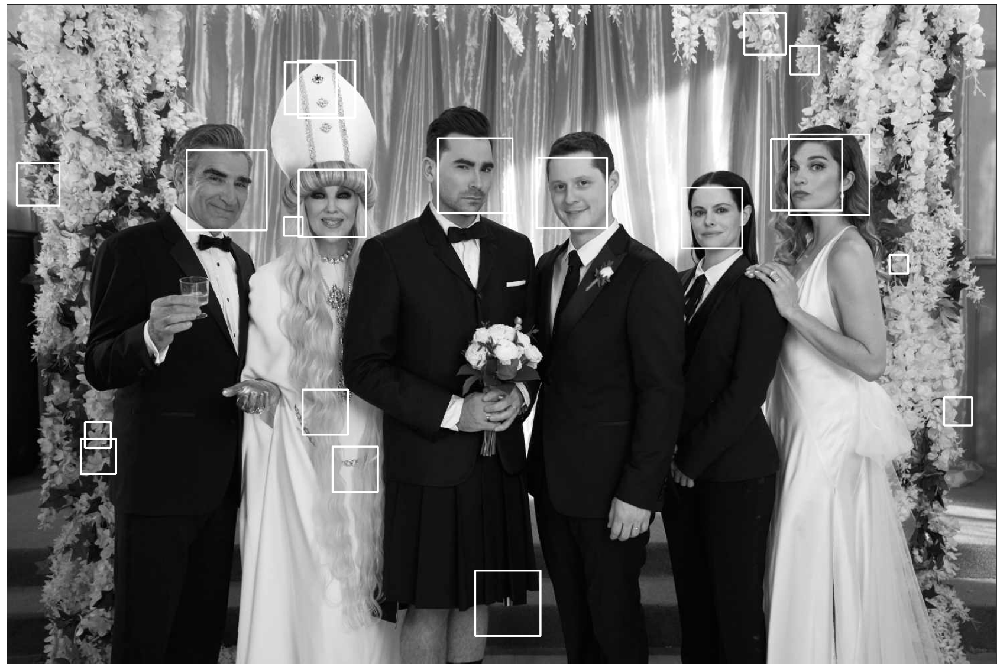

In [82]:
#pretty much straight from tutorial, I am assuming use an existing implimentation means I can use opencv now
face_cascade = cv2.CascadeClassifier('./haarcascade_frontalface_default.xml') #chosen model

creekV = cv2.imread('./schitts_creek_group_photo.jpeg', cv2.IMREAD_GRAYSCALE)

faces = face_cascade.detectMultiScale(creekV, 1.1, 2)

for (x,y,w,h) in faces:
    creekV = cv2.rectangle(creekV,(x,y),(x+w,y+h),(255,0,0),2)


plt.figure(figsize=(30,30))
plt.imshow(creekV, cmap="gray")
plt.xticks(())
plt.yticks(())
plt.show()

Under what conditions would you expect the Viola-Jones detector to
work when PCA does not?
I have 9 false positives in with viola jones. I expect viola jones to work when the better than PCA in situations like this where the training data set for PCA is low. Viola Jones also steers away from a sliding window, only taking probable regions this is why it would likely perform better in a photo with a lot of other objects that arent faces PCA might still detect. 